# Technical Report 

#### Group: Hungry Students
Emil Deshasta, Mustafa Al-Azawi, Philip Frisch Møller, Sergio Vinagre Madrid and Vera Nijmeijer

## Introduction and Data Collection

This project will focus on reducing food waste in Copenhagen capital area.
This has become a severe problem lately as 1,214,000 tons of food end up in
Danish garbage bins every year. The idea is to find out what food is going
to be discarded and in what quantity so that supermarkets will reduce the
purchase of those products, maximizing their profits and also reducing the
food that will be thrown away.

The poject will utilise Salling Group's freely available API as the data source for this 
project. For documentation see https://developer.sallinggroup.com/api-reference

We start by importing all necessary packages

In [43]:
# import libs
import requests
import json
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from urllib.request import urlopen
import json
import plotly.express as px
from sklearn.feature_extraction import _stop_words
from sklearn.decomposition import PCA
import string
from nltk.stem import WordNetLemmatizer
from sentence_transformers import SentenceTransformer
from adjustText import adjust_text
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans

API credentials are stored locally in a .txt file, the below code simply reads the stored credentials.

In [44]:
# define paths
API_key_path = "API keys/salling_bearer.txt"

# get credentials
def get_file_contents(filename):
    try:
        with open(filename, 'r') as f:
            # It's assumed our file contains a single line,
            # with our API key
            return f.read().strip()
    except FileNotFoundError:
        print("'%s' file not found" % filename)

API_key = get_file_contents(API_key_path)

One of the main obstacles to business analytics is data availability and quantity. The API does not allow requests going back in time, so one way of increasing the data quantity is increasing the geographic scope such that our data set includes as many offers as possible. The API allows for specifying zipcodes as part of the request. By having a list of possible zipcodes in scope, we can simply loop over them and append the individual requests responses. 

Importing a list of all zip codes in the capital region in Denmark taken from https://www.regionh.dk/english/about-the-capital-region/facts-about-the-region/Pages/Postal-codes.aspx

In [45]:
# define zip codes
zipcodedf = pd.read_csv("data/zipcodes.csv")
zipcodedf

,Postal Code,City
0,555,Scanning
1,800,Høje Taastrup
2,877,Valby
3,899,Kommuneservice
4,900,København C
...,...,...
738,3760,Gudhjem
739,3770,Allinge
740,3782,Klemensker
741,3790,Hasle


The below code shows how the data is requested through the API for each unique zip code, where it is then parsed and stored as a pandas data frame. Naturally, this is a timely process and as such, we have saved the already requested data as a .csv file that we can simply read also using the below code. 

In [46]:
# define function that retrieves data from API or .csv file
def getData(useAPI):
    
    if useAPI == True:
        # define unique zipcodes
        uniqueZipCodes = zipcodedf['Postal Code'].unique()
        # loop over unique zip codes
        for i, zipcode in enumerate(uniqueZipCodes):
            
            endpoint_url = f"https://api.sallinggroup.com/v1/food-waste?zip={zipcode}"

            # Set your API key or access token as a header
            headers = {"Authorization": f"Bearer {API_key}"}
            # Make the HTTP GET request to the API endpoint
            response = requests.get(endpoint_url, headers=headers)
            
            if response.status_code == 200:
                # Parse the response content as JSON
                data = response.json()
            else:
                print("Error: Failed to retrieve data from API")

            data = response.json()
            # create data frame structre
            if i == 0:
                df = pd.json_normalize(data, record_path=['clearances'], meta=['store', ['store', 'brand'], ['store', 'name'], ['store', 'id']])
            # iteratively join data frames for different zip codes
            else:
                # some zip codes are not available via the API
                try:
                    df = pd.concat([df, pd.json_normalize(data, record_path=['clearances'], meta=['store', ['store', 'brand'], ['store', 'name'], ['store', 'id']])])
                except:
                    pass
            
            # requests are expected to have at least 1 sec in between requests
            time.sleep(1)

        # join adress specific data to df
        df = df.reset_index(drop=True)
        df = df.join(pd.json_normalize(df['store']))
        
        # data cleaning and formatting

        # clean up coordinates
        df[['lat', 'lon']] = ((df['coordinates'].astype(str)).str.strip('[]').str.split(',', expand=True).astype(float))

        # there are 2700 ish rows with nan as product category
        # we will filter these out
        df = df.dropna(subset='product.categories.en')

        # clean product categories 
        df['product.categories.en'] = df['product.categories.en'].str.replace('>sification 1 root>umer Faced Hierarchy','')
        new = df["product.categories.en"].str.split(">", n = 6, expand = True)

        for i in np.arange(0,6,1):
            try:
                df[f'product.category.en.level{i}'] = new[i]
            except:
                df[f'product.category.en.level{i}'] = 'nan'

        # add year, month, weekday and hour for each timestamp
        df['offer.endTime']  = pd.to_datetime(df['offer.endTime']).dt.tz_convert('Europe/Berlin')
        df['offer.startTime'] = pd.to_datetime(df['offer.startTime']).dt.tz_convert('Europe/Berlin')
        df['offer.lastUpdate'] = pd.to_datetime(df['offer.lastUpdate']).dt.tz_convert('Europe/Berlin')

        df['offer.endTime.hour'] = df['offer.endTime'].dt.hour
        df['offer.endTime.weekday'] = df['offer.endTime'].dt.weekday
        df['offer.endTime.month'] = df['offer.endTime'].dt.month
        df['offer.endTime.year'] = df['offer.endTime'].dt.year

        df['offer.startTime.hour'] = df['offer.startTime'].dt.hour
        df['offer.startTime.weekday'] = df['offer.startTime'].dt.weekday
        df['offer.startTime.month'] = df['offer.startTime'].dt.month
        df['offer.startTime.year'] = df['offer.startTime'].dt.year

        df['offer.lastUpdate.hour'] = df['offer.lastUpdate'].dt.hour
        df['offer.lastUpdate.weekday'] = df['offer.lastUpdate'].dt.weekday
        df['offer.lastUpdate.month'] = df['offer.lastUpdate'].dt.month
        df['offer.lastUpdate.year'] = df['offer.lastUpdate'].dt.year

    else:
        # read data from .csv
        df = pd.read_csv('data/data.csv')
    
    # print size of data frame
    print(f'size of dataframe:{np.shape(df)}')
    
    return df

Rudimentary data cleaning is also handled by the above code: all offers with missing product code were dropped (product categorisation/segmentation information will be used extensively throughout the report and it was therefore important to drop missing data). The product categories were stored in string where each 'level' was inbetween '>sification 1 root>umer Faced Hierarchy', and as such, we could define 6 levels of product categorisation, each with its own granularity. Finally, the temporal variables where defined. 


In [47]:
# define data frame
df = getData(useAPI=False)
# print out first 5 rows
df.head()

size of dataframe:(7134, 52)


,Unnamed: 0,offer.currency,offer.discount,offer.ean,offer.endTime,offer.lastUpdate,offer.newPrice,offer.originalPrice,offer.percentDiscount,offer.startTime,...,offer.endTime.month,offer.endTime.year,offer.startTime.hour,offer.startTime.weekday,offer.startTime.month,offer.startTime.year,offer.lastUpdate.hour,offer.lastUpdate.weekday,offer.lastUpdate.month,offer.lastUpdate.year
0,0,DKK,10.00,5712580187969,2023-03-25 23:59:59+01:00,2023-03-24 15:56:40+01:00,35.0,45.00,22.22,2023-03-24 09:56:55+01:00,...,3,2023,9,4,3,2023,15,4,3,2023
1,1,DKK,4.95,5712580185163,2023-03-25 23:59:59+01:00,2023-03-24 18:11:42+01:00,17.0,21.95,22.55,2023-03-18 11:49:48+01:00,...,3,2023,11,5,3,2023,18,4,3,2023
2,2,DKK,19.95,5712580187945,2023-03-25 23:59:59+01:00,2023-03-24 18:11:42+01:00,25.0,44.95,44.38,2023-03-24 09:53:17+01:00,...,3,2023,9,4,3,2023,18,4,3,2023
3,3,DKK,16.95,5712580187419,2023-03-28 23:59:59+02:00,2023-03-24 19:56:42+01:00,25.0,41.95,40.41,2023-03-22 14:44:41+01:00,...,3,2023,14,2,3,2023,19,4,3,2023
4,4,DKK,21.95,5712580187907,2023-03-28 23:59:59+02:00,2023-03-24 20:11:39+01:00,15.0,36.95,59.40,2023-03-24 09:06:20+01:00,...,3,2023,9,4,3,2023,20,4,3,2023


## Exploratory Analysis

### Product Categorisation

Test how each product category (in this case the highest level (least granular) i.e. level0) is represented in the data. Level0 was chosen here is it is the most high level product descriptor and even so, it remains very descriptive and granular.

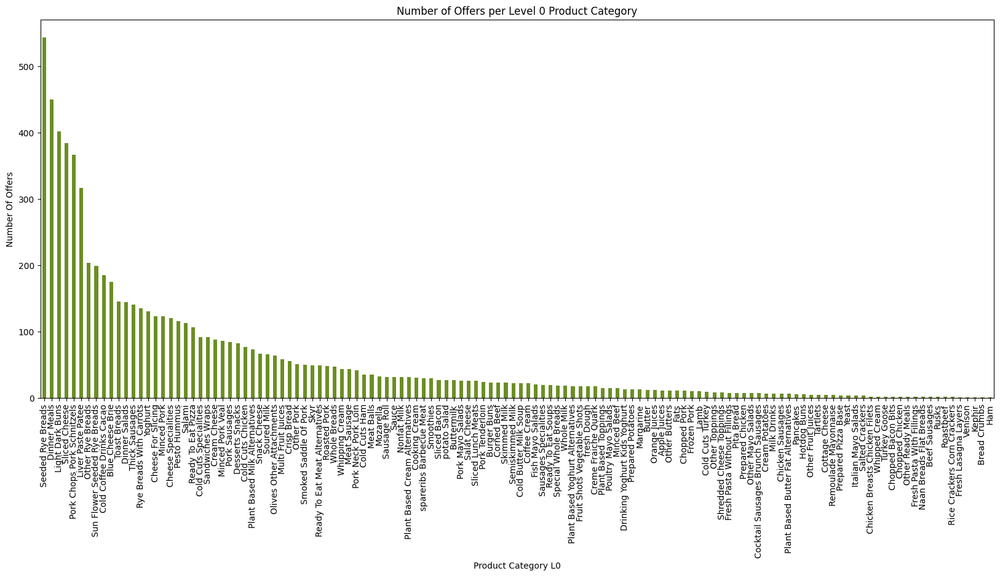

In [48]:
# visualise data
# start offer
df_offersPerCategoryL0 = df[['offer.startTime','product.category.en.level0']].groupby('product.category.en.level0').count()
df_offersPerCategoryL0 = df_offersPerCategoryL0.rename(columns = {'offer.startTime': 'NumberOfOffers'})
df_offersPerCategoryL0 = df_offersPerCategoryL0.sort_values('NumberOfOffers', ascending=False)
# create plot
df_offersPerCategoryL0.plot.bar(figsize=(20,8), legend=False,ylabel='Number Of Offers', xlabel='Product Category L0', title='Number of Offers per Level 0 Product Category',color='olivedrab')
plt.show()

It is noted that not all product categories are represented equally. The majority of offers are within a few distinct product cateogries. There are also a lot of categories with very few offers which will make doing any analytics with said product groups difficult. Later in the report, we will use NLP to create a higher level segmentation. 

Conitinuation of exploratory analysis
...

### Geographic distributions

hHw are the offers distributed geographically around the capital region based on the lat lon coordinates found in the data.

In [49]:
# initialise map
map_1 = folium.Map([55.680168, 12.58234], zoom_start=8,tiles = "Stamen Toner")
# transform data
df_heat = df[['lon','lat']].dropna()
heat_data = [[row['lon'],row['lat']] for index, row in df_heat.iterrows()]
# add coordinates to initialised map
HeatMap(heat_data, radius=14).add_to(map_1)
# show map
map_1

As expected, most of the offers occur in stores in and around the central copenhagen area. This could simply be due to there being more stores in those regions. 

Visualising the distribution per municipality as seen below (the below code makes use of a geojson file found via https://raw.githubusercontent.com/magnuslarsen/geoJSON-Danish-municipalities/master/postal_codes/postal_codes.geojson that essentially maps zipcodes to polygons of said zip code):

In [50]:
# get geojson describing danish municipalities
with urlopen('https://raw.githubusercontent.com/magnuslarsen/geoJSON-Danish-municipalities/master/postal_codes/postal_codes.geojson') as response:
    cities = json.load(response)

# data prep
df_offersPerZip = df[['offer.startTime','address.zip']].groupby('address.zip').count()
df_offersPerZip = df_offersPerZip.reset_index()
df_offersPerZip = df_offersPerZip.rename(columns = {'offer.startTime': 'NumberOfOffers', 'address.zip': 'postal_code'})
df_offersPerZip['postal_code'] = df_offersPerZip['postal_code'].astype(str)
df_offersPerZip = df_offersPerZip.sort_values('NumberOfOffers', ascending=False)

# plot using plotly
fig = px.choropleth_mapbox(df_offersPerZip, geojson=cities, locations='postal_code', color='NumberOfOffers',
                           color_continuous_scale="Emrld",
                           mapbox_style="carto-positron",
                           zoom=8,
                           center = {"lat": 55.680168, "lon": 12.58234},
                           opacity=0.5,
                           featureidkey="properties.postal_code"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

The above visualisations are perhaps a bit misleading as, as stated before, different zip codes have varying store counts. Below we have plotted the store count as a function of city which shows that store density is highest in and around the city center.

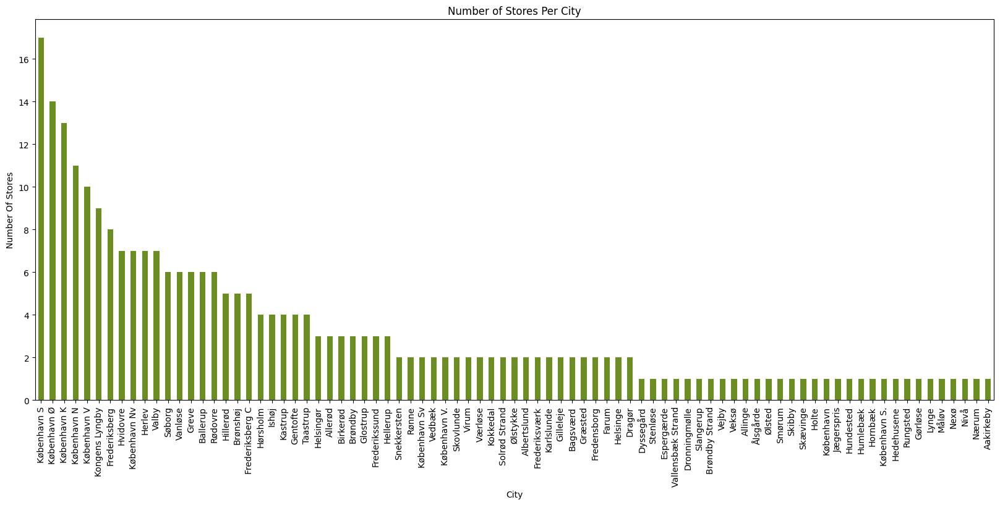

In [51]:
# how many shops per city/postal codes
df_NumberOfStores = df[['address.street','address.city']].groupby('address.city').nunique()
df_NumberOfStores = df_NumberOfStores.rename(columns = {'address.street': 'NumberOfStores'})
df_NumberOfStores = df_NumberOfStores.sort_values('NumberOfStores', ascending=False)
# create plot
df_NumberOfStores.plot.bar(figsize=(20,8), legend=False,ylabel='Number Of Stores', xlabel='City', title='Number of Stores Per City',color='olivedrab')
plt.show()

The stores with highest amount of offers:

In [52]:
# show top 5
df_NumberOfOffersperStore = df[['address.street','address.city','offer.startTime']].groupby(['address.street','address.city']).count()
df_NumberOfOffersperStore = df_NumberOfOffersperStore.rename(columns = {'offer.startTime': 'NumberOfOffers'})
df_NumberOfOffersperStore = df_NumberOfOffersperStore.sort_values('NumberOfOffers', ascending=False)
df_NumberOfOffersperStore.head()

,,NumberOfOffers
address.street,address.city,
Borupvang 2,Ballerup,142
Arne Jacobsens Alle 24,København S,93
Ishøj Lille Torv 1,Ishøj,92
Slotsarkaderne 26,Hillerød,89
Greve Midtby Center 16,Greve,79


Normalising by the number of stores per zip code to identify areas with highest amount of offers per store.

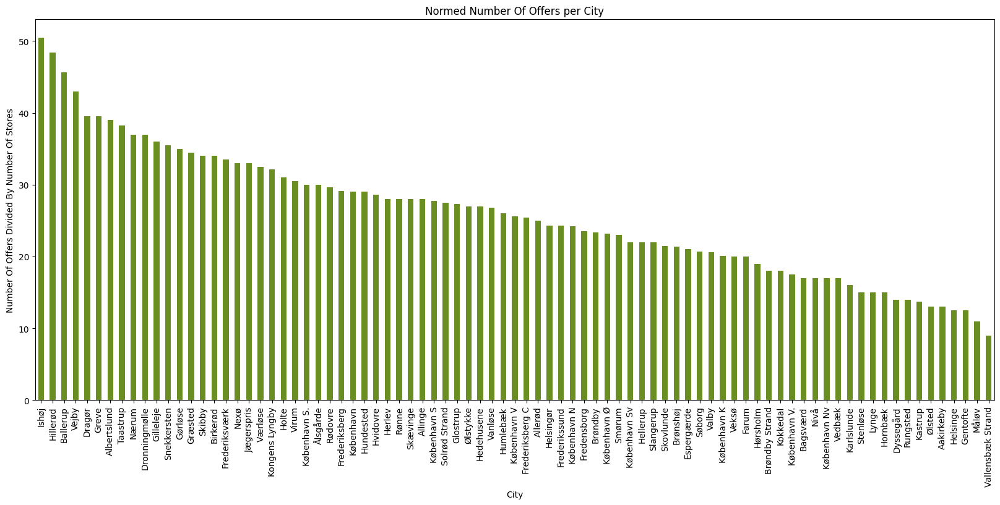

In [53]:
# normalised offers per city based on how many stores are in a city
df_NumberOfOffers_norm = df[['address.street','address.city']].groupby('address.city').nunique().join(df[['offer.startTime','address.city']].groupby('address.city').count())
df_NumberOfOffers_norm = df_NumberOfOffers_norm.rename(columns = {'offer.startTime': 'NumberOfOffers', 'address.street': 'NumberOfStores'})
df_NumberOfOffers_norm['NumberOfOffersNormed'] = df_NumberOfOffers_norm['NumberOfOffers']/df_NumberOfOffers_norm['NumberOfStores']
df_NumberOfOffers_norm = df_NumberOfOffers_norm.sort_values('NumberOfOffersNormed',ascending=False)

df_NumberOfOffers_norm[['NumberOfOffersNormed']].plot.bar(figsize=(20,8), legend=False,ylabel='Number Of Offers Divided By Number Of Stores', xlabel='City', title='Normed Number Of Offers per City',color='olivedrab')
plt.show()

In [64]:
# geo heat map representing the number of offers per number of stores per region
# get geojson describing danish municipalities
with urlopen('https://raw.githubusercontent.com/magnuslarsen/geoJSON-Danish-municipalities/master/postal_codes/postal_codes.geojson') as response:
    cities = json.load(response)

# data prep
df_NumberOfOffers_norm = df_NumberOfOffers_norm.reset_index()

# plot using plotly
fig = px.choropleth_mapbox(df_NumberOfOffers_norm, geojson=cities, locations='address.city', color='NumberOfOffersNormed',
                           color_continuous_scale="Emrld",
                           mapbox_style="carto-positron",
                           zoom=8,
                           center = {"lat": 55.680168, "lon": 12.58234},
                           opacity=0.5,
                           featureidkey="properties.label_dk"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Interestingly, we see that the areas with high offer counts per number of stores are located furhter away from the city center.

## NLP for Product Categorisation

As previously stated, a potential obstacle for analytics is the high granularity in the product categorisation, even on the highest level. This is especially a potential obstacle for this specific data set as we cannot expand the scoping temporally. An approach could be to simply include the top X represented product categoires and make forecasting algorithms for them, however, one major downside to this approach is that we would decrease the total amount of data in the data set. Another approach is to create a higher level product segmentation that are more uniformly represented in the dataset that one could subsequently apply forecasting models to.  

One could ofcourse choose to do this manually which would naturally take time. We have chosen to use NLP, using the context of the words used in the product categorisation, to cluster like product categories.

First step is to process each high level product category where we remove punctuation, we set everything to lowercase, remove stop words and lemmatize.

In [55]:
# using code from lecture exercises
lemmatizer = WordNetLemmatizer()

# pre process words
def text_processing(text):
    # remove punctuation 
    text = "".join([c for c in text 
                    if c not in string.punctuation])
    # lowercase
    text = "".join([c.lower() for c in text])
    # remove stopwords
    text = " ".join([w for w in text.split() 
                     if w not in _stop_words.ENGLISH_STOP_WORDS])
    # stemming / lematizing (optional)
    text = " ".join([lemmatizer.lemmatize(w) for w in text.split()])
    
    return text

# define unique level 0 categories
L0categories = df['product.category.en.level0'].unique()

# apply text processing
cleanL0categories = np.empty(np.shape(L0categories)[0],dtype=object)
for i, text in enumerate(L0categories):
    cleanL0categories[i] = (text_processing(text))

Next step is to embed these potentially multi word categorisations into unique vectors for each category. To do this, we have chosen to rely on a pretrained model with documentation: https://www.sbert.net/


In [56]:
# define model
model = SentenceTransformer('all-MiniLM-L6-v2') #https://www.sbert.net/
# vectorize each categary
vectorembeddings = model.encode(cleanL0categories)

Running a 2 dimensional PCA on the now vectorised categories. (2 PC's is not enough to explain most of the variance but it is done here for visualisation purposes) 

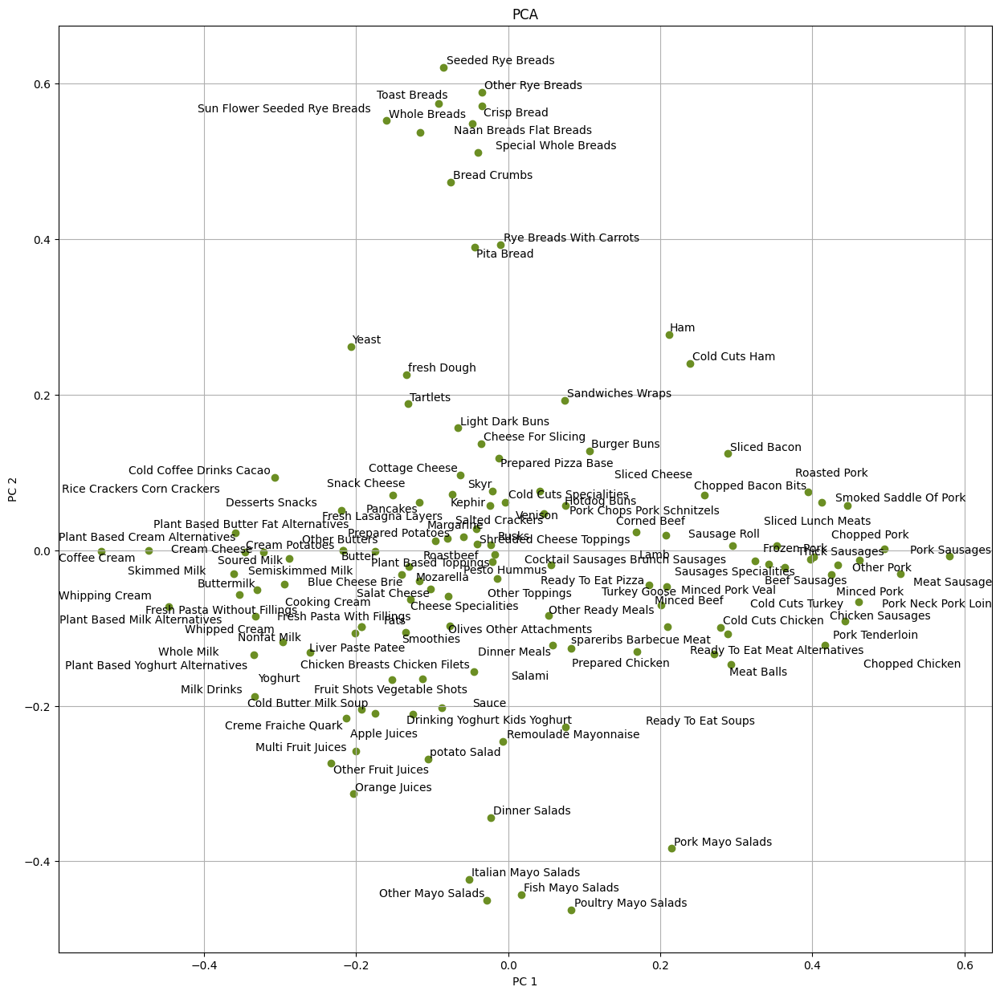

In [57]:
# PCA
pca = PCA(n_components=2)
vectors_2d = pca.fit_transform(np.array(vectorembeddings))

# initialise figure
plt.figure(figsize=(15,15))
plt.scatter(vectors_2d.T[0], vectors_2d.T[1], color='olivedrab')
# add annotations
texts = [plt.text(vectors_2d.T[0,i], vectors_2d.T[1,i], L0categories[i]) for i in range(len(L0categories))]
adjust_text(texts, fontsize=5)          
# add labelling
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('PCA')
plt.grid()
plt.show()

Evidently, with just PC 2, it is easy to distinguish breads and salads from the rest of the categories. PC 1 is more difficult to discern, but it vaguely distinguishes dairy products and meat products although are clearly examples of confusion Chicken breasts. Furthermore, vegetables, crackers, smoothies, and other specific categories are not realy captured in these dimensions.

Running PCA with 10 PC's and plot the explained variance as a fucntion of number of PC's:

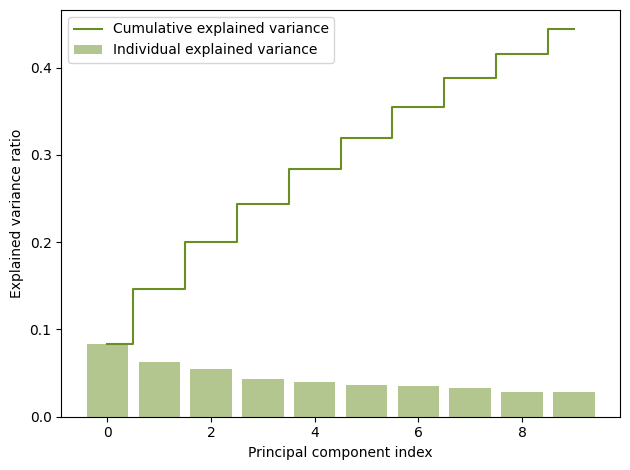

In [65]:
# initialise PCA
pca = PCA(n_components=10)
X = pca.fit_transform(np.array(vectorembeddings))

# compute explained variance
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# plot
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance', color='olivedrab')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance', color='olivedrab')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

Evidently, with 10 PC's we approximately capture 50% of the total variance in the data set. 

As a simularity measure, the pairwise cosine simularity is computed for each catergory:

$\text{similarity} = \cos(\theta) = {\mathbf{A} \cdot \mathbf{B} \over \|\mathbf{A}\|_2 \|\mathbf{B}\|_2} $

Kmeans clustering is subsequently used to compute the clusters of like similarity vectors. To identify the optimal clustering oreder, we can compute the clustering inertia as a function of the amount of clusters. The optimal clustering amount will be where there is a significant change in the rate of change of intertia per number of clusters.

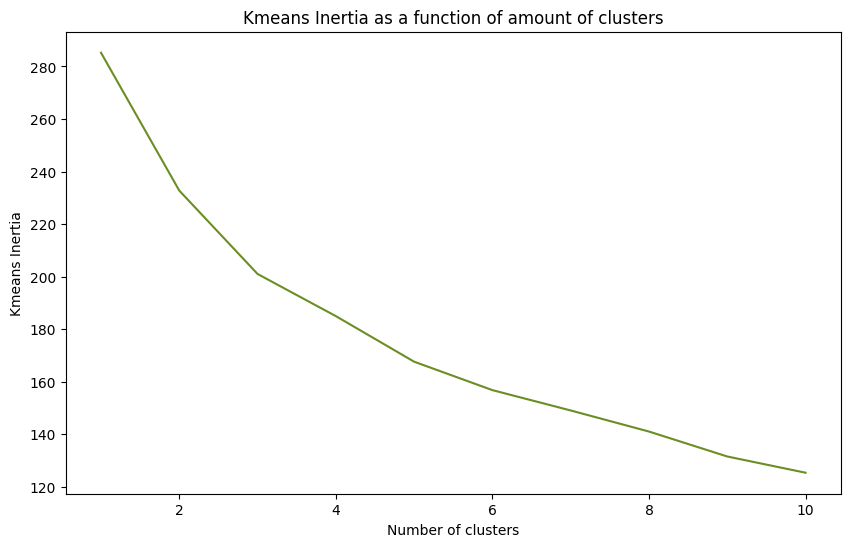

In [59]:
# create cosine simularity matrix
df_cosine=pd.DataFrame(cosine_similarity(np.array(vectorembeddings),dense_output=True))

# initialise kmeans inertia
inertia = []
# initialise plot
plt.figure(figsize=(10,6))

# compute kmeans inertia for each cluster amount
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_cosine)
    inertia.append(kmeans.inertia_)

# plot
plt.plot(range(1, 11), inertia, color='olivedrab')
plt.title('Kmeans Inertia as a function of amount of clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Kmeans Inertia')
plt.show()

It can be argued that the optimal amount of clusters in either 3 or 5. It also comes down two which clustering type makes the most contextual sense (in terms of what categories are captured in the same cluster). Below are k=3 and k=5 clusters represented in terms of which categories are presented in each. 

In [60]:
# define clustering
kmeans = KMeans(n_clusters=3,random_state=0)
kmeans.fit(df_cosine)
labels = kmeans.labels_

clusteringresults = pd.DataFrame({'L0Categories' : L0categories,'Label': labels})

for i in clusteringresults['Label'].unique():
    print(f"Label {i}")
    print(clusteringresults[clusteringresults['Label']==i]['L0Categories'].unique())


Label 1
['Special Whole Breads' 'Dinner Meals' 'Blue Cheese Brie' 'Cream Cheese'
 'Toast Breads' 'Burger Buns' 'Sandwiches Wraps' 'Dinner Salads'
 'Soured Milk' 'Semiskimmed Milk' 'Whipping Cream'
 'Rye Breads With Carrots' 'Other Rye Breads' 'Cheese For Slicing'
 'Sliced Cheese' 'potato Salad' 'Poultry Mayo Salads' 'Other Toppings'
 'Shredded Cheese Toppings' 'fresh Dough' 'Plant Based Toppings'
 'Desserts Snacks' 'Nonfat Milk' 'Whole Breads' 'Snack Cheese'
 'Skimmed Milk' 'Yoghurt' 'Cheese Specialities' 'Fish Mayo Salads'
 'Milk Drinks' 'Sauce' 'Crisp Bread' 'Other Butters' 'Other Mayo Salads'
 'Buttermilk' 'Whole Milk' 'Cold Butter Milk Soup' 'Cooking Cream'
 'Coffee Cream' 'Salat Cheese' 'Butter' 'Italian Mayo Salads' 'Margarine'
 'Pancakes' 'Hotdog Buns' 'Fats' 'Other Ready Meals' 'Bread Crumbs'
 'Cottage Cheese' 'Whipped Cream' 'Pita Bread' 'Cream Potatoes']
Label 0
['Pork Sausages' 'Cold Cuts Chicken' 'Smoked Saddle Of Pork'
 'Pork Chops Pork Schnitzels' 'Thick Sausages' 'Cold C

In [61]:
# define clustering
kmeans = KMeans(n_clusters=5,random_state=0)
kmeans.fit(df_cosine)
labels = kmeans.labels_

clusteringresults = pd.DataFrame({'L0Categories' : L0categories,'Label': labels})

for i in clusteringresults['Label'].unique():
    print(f"Label {i}")
    print(clusteringresults[clusteringresults['Label']==i]['L0Categories'].unique())



Label 1
['Special Whole Breads' 'Toast Breads' 'Seeded Rye Breads'
 'Sun Flower Seeded Rye Breads' 'Rye Breads With Carrots'
 'Other Rye Breads' 'fresh Dough' 'Whole Breads' 'Crisp Bread'
 'Naan Breads Flat Breads' 'Yeast' 'Bread Crumbs' 'Pita Bread']
Label 4
['Dinner Meals' 'Blue Cheese Brie' 'Cream Cheese' 'Sandwiches Wraps'
 'Soured Milk' 'Semiskimmed Milk' 'Whipping Cream' 'Cheese For Slicing'
 'Sliced Cheese' 'Other Toppings' 'Shredded Cheese Toppings'
 'Plant Based Toppings' 'Desserts Snacks' 'Nonfat Milk' 'Snack Cheese'
 'Skimmed Milk' 'Yoghurt' 'Cheese Specialities' 'Milk Drinks' 'Sauce'
 'Other Butters' 'Buttermilk' 'Whole Milk' 'Cold Butter Milk Soup'
 'Cooking Cream' 'Coffee Cream' 'Salat Cheese' 'Butter' 'Margarine'
 'Pancakes' 'Fats' 'Other Ready Meals' 'Cottage Cheese' 'Whipped Cream'
 'Cream Potatoes']
Label 0
['Pork Sausages' 'Burger Buns' 'Cold Cuts Chicken' 'Smoked Saddle Of Pork'
 'Pork Chops Pork Schnitzels' 'Thick Sausages' 'Cold Cuts Ham'
 'Meat Sausage' 'Meat Bal

Evidently, the k=5 clustering makes the most sense contextually. :

- Label 1: breads and baking
- Label 2: finished meals and dairy
- Label 0: Meats
- Label 2: Miscellaneous and specialties
- Label 3: salads

Certainly one could make clusters that make more intuitive sense manually, i.e why does finished salads deserve their own label?
This us likely due to all salad clusterings share salad a word that is included and as such are clustered together. This could prove an issue

Saving labels for k=5 clustering:

In [62]:
# initialise mapping
clustermapping = {}

for i, text in enumerate(clusteringresults['L0Categories'].unique()):
    clustermapping[text] = str(clusteringresults['Label'][i])

df['L0Categories.new'] = df['product.category.en.level0'].map(clustermapping)

Checking how well the the new labels are represented in the data. 

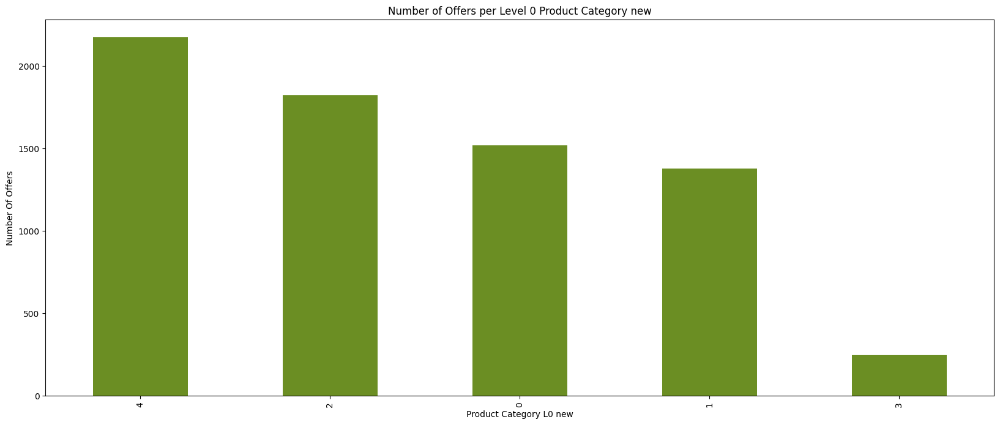

In [63]:
# visualise new categories 
df_offersPerCategoryL0new = df[['offer.startTime','L0Categories.new']].groupby('L0Categories.new').count()
df_offersPerCategoryL0new = df_offersPerCategoryL0new.rename(columns = {'offer.startTime': 'NumberOfOffers'})
df_offersPerCategoryL0new = df_offersPerCategoryL0new.sort_values('NumberOfOffers', ascending=False)
# create plot
df_offersPerCategoryL0new.plot.bar(figsize=(20,8), legend=False,ylabel='Number Of Offers', xlabel='Product Category L0 new', title='Number of Offers per Level 0 Product Category new',color='olivedrab')
plt.show()

Evidently most of the labels more or less equally distributed, except for the salads category, which has significantly less representation. 